<a href="https://colab.research.google.com/github/sohan2311/SIC-Project---Brain-Tumor-Detection-using-VGG-16-/blob/main/Final_Project_Brain_Tumor_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# `Brain Tumor Detection Using VGG - 16 Model`

# <a id='intro'> Name : `SOHAN MAITY`  | </a> , <a id='intro'> Roll No  : `523EC0001`  | <a id='intro'> Email  : `523ec0001@iiitk.ac.in` </a><br><a id='intro'>`Indian Institute of Information Technology Design and Manufacturing Kurnool` - (IIITDM Kurnool) </a><br><a id='intro'> Samsung Innovation Campus : `Final Project Presentation` </a>



**<center><font size=5>`Brain Tumor Detection with VGG-16 Model`</font></center>**
***
**Project By** : Sohan Maity

**Date**: March 13 , 2025 ( Thursday )

**Table of Contents**
- <a href='#intro'>1. Objective</a>
    - <a href='#dataset'>1.1. Data Set Description</a>
    - <a href='#tumor'>1.2. What is Brain Tumor?</a>
- <a href='#env'>2. Environment Created for DataSet Training</a>
- <a href='#import'>3. Data Import and Preprocessing</a>
- <a href='#cnn'>4. CNN Model</a>
    - <a href='#aug'>4.1. Data Augmentation</a>

    - <a href='#build'>4.2. Model Building</a>
    - <a href='#perf'>4.3. Model Performance</a>
- <a href='#concl'>5. Conclusions</a>

# <a id='intro'>1. Objective : </a>



The main purpose of this project was to build a CNN model that would classify if subject has a tumor or not base on MRI scan. I used the [VGG-16](https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection) model architecture and weights to train the model for this binary problem. I used `accuracy` as a metric to justify the model performance which can be defined as:

$\textrm{Accuracy} = \frac{\textrm{Number of correclty predicted images}}{\textrm{Total number of tested images}} \times 100\%$

Final results look as follows:

| Set | Accuracy |
|:-:|:-:|
| Training Set | ~88% |
| Final Test Set | ~82% |
<br>
* *Note: there might be some misunderstanding in terms of set names so I want to describe what do I mean by `Final Test Set ` and `Training Set` :*
* *`Training Set` - is the set used during the model training to adjust the hyperparameters. *

* *`Final Test set` - is the small set that I don't touch for the whole training process at all. It's been used for final model performance evaluation.*

## <a id='dataset'>1.1. Data Set Description</a>

The image data that was used for this problem is [Brain MRI Images for Brain Tumor Detection](https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection). It conists of MRI scans of two classes:

* `NO` - no tumor, encoded as `0`
* `YES` - tumor, encoded as `1`

> Note : Source to this DataSet : from where all Brain Scans were Collected couldn't be known .

## <a id='tumor'>1.2. What is Brain Tumor?</a>

> A `brain tumor` is an abnormal mass of cells in the brain, which can be benign (non-cancerous) or malignant (cancerous). Tumors can originate in the brain (primary tumors) or spread from other body parts (secondary or metastatic tumors). They disrupt brain function by compressing tissues, increasing pressure, or invading healthy cells. Common symptoms include persistent headaches, seizures, vision or speech difficulties, memory loss, and personality changes. Diagnosis involves MRI, CT scans, and biopsy. Treatment varies based on tumor type, size, and location, including surgery, radiation therapy, chemotherapy, and targeted therapies. Early detection improves the chances of successful treatment.
>
> ![](https://upload.wikimedia.org/wikipedia/commons/5/5f/Hirnmetastase_MRT-T1_KM.jpg)
>
> *Brain metastasis in the right cerebral hemisphere from lung cancer, shown on magnetic resonance imaging.*

Source: [Wikipedia](https://en.wikipedia.org/wiki/Brain_tumor)


# <a id='env'>2. Environment Created for DataSet Training</a>

In [ ]:
from IPython.display import clear_output
!pip install imutils
clear_output()

# provides convenient functions for image processing, particularly with OpenCV.

In [ ]:
!pip install tqdm opencv-python matplotlib scikit-learn plotly keras tensorflow imutils


1) tqdm :
Provides a progress bar for loops and iterative operations.
Useful for tracking the training progress of deep learning models.

2) opencv-python :
OpenCV (Open Source Computer Vision Library) is used for image processing.
Helps with reading, modifying, and analyzing MRI images.

3) matplotlib :
A data visualization library for plotting images, graphs, and charts.
Useful for displaying MRI scans and model performance metrics.

4) scikit-learn (sklearn) :  
Provides tools for machine learning models, data preprocessing, and evaluation.
Used for feature extraction, dataset splitting, and performance evaluation.

5) plotly :
A powerful visualization library for interactive plots.
Helps in plotting 3D graphs, model accuracy, and loss curves.

6) keras :
A high-level deep learning API that runs on top of TensorFlow.
Used for building and training deep learning models.

7) tensorflow :
A deep learning framework for training CNN models.
Essential for implementing brain tumor detection with neural networks.

8) imutils :
A helper library for OpenCV, providing easy-to-use image processing functions.
Used for resizing, rotating, and preprocessing MRI images.

In [ ]:
import plotly.io as pio
pio.renderers.default = "colab"

# deals with rendering and exporting figures

In [ ]:
!pip uninstall -y opencv-python opencv-python-headless
!pip install opencv-python-headless


Found existing installation: opencv-python 4.11.0.86
Uninstalling opencv-python-4.11.0.86:
  Successfully uninstalled opencv-python-4.11.0.86
Found existing installation: opencv-python-headless 4.11.0.86
Uninstalling opencv-python-headless-4.11.0.86:
  Successfully uninstalled opencv-python-headless-4.11.0.86
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 10.9 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator # Image Augmentation
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input # popular pretrained Convolutional Neural Network (CNN)
#that has already learned useful features from millions of images (ImageNet dataset).
from tensorflow.keras import layers # Neural Network Layers
from tensorflow.keras.models import Model, Sequential # Model Building
from tensorflow.keras.optimizers import Adam, RMSprop # Optimisers
from tensorflow.keras.callbacks import EarlyStopping # Training Control


In [ ]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available: 0


The next set of code imports essential libraries for brain tumor detection using Convolutional Neural Networks (CNNs) on MRI scans. The libraries can be categorized into data processing, machine learning, deep learning, and visualization.

In [ ]:
import numpy as np #numerical computations
from tqdm import tqdm #progress bar displayed during loops
import cv2 #used in Image Processing
import os #handles path , directory direction and dataset management
import shutil #used for copying , moving and organising files
import itertools #efficient iterations
import imutils #library used for image processing
import matplotlib.pyplot as plt #data visualisation Library
from sklearn.preprocessing import LabelBinarizer #converts categorical levels into numerical format in ML
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import plotly.graph_objs as go #creates interactive graphical visualisation
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

# Use tensorflow.keras instead of keras for ImageDataGenerator and other imports , builts and train CNNs

from tensorflow.keras.preprocessing.image import ImageDataGenerator #imagedata processing
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input # VGG 16 is a pretrained CNN model
from tensorflow.keras import layers # provides building blocks for CNN models
from tensorflow.keras.models import Model, Sequential #layer by layer Neural Network
from tensorflow.keras.optimizers import Adam, RMSprop # adaptive learning rate optimisers
from tensorflow.keras.callbacks import EarlyStopping # prevents overfitting

init_notebook_mode(connected=True)
RANDOM_SEED = 123 #ensures consistent results when Model is trained Multiple Times

In [ ]:
import tensorflow as tf
from zipfile import ZipFile  #unzips zip file
import os,glob
import cv2
from tqdm._tqdm_notebook import tqdm_notebook as tqdm
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Convolution2D, Dropout, Dense,MaxPooling2D #edges , shapes and textures MRI images
from keras.layers import BatchNormalization
from keras.layers import MaxPooling2D
from keras.layers import Flatten

<ipython-input-8-4addd0ae159c>:5: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`



Detects edges, shapes, and textures in MRI images.

Applies filters (kernels) to capture important features.

model.add(Convolution2D(32, (3,3), activation='relu', input_shape=(128,128,3)))

1) 32 filters (kernels)

2) 3x3 kernel size

3) ReLU activation (avoids negative values)



In [ ]:
from google.colab import files

uploaded = files.upload() #file uploaded from kaggle

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  # Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

# This code is used to upload a file to Google Colab and set up Kaggle API access for downloading datasets.

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 69 bytes


In [ ]:
!kaggle datasets download -d navoneel/brain-mri-images-for-brain-tumor-detection

# This command downloads the "Brain MRI Images for Brain Tumor Detection" dataset from Kaggle into Google Colab.

Dataset URL: https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection
License(s): copyright-authors
 73% 11.0M/15.1M [00:00<00:00, 44.8MB/s]
100% 15.1M/15.1M [00:00<00:00, 58.0MB/s]


In [ ]:
from zipfile import ZipFile
file_name = "/content/brain-mri-images-for-brain-tumor-detection.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('Done')

# This code extracts the downloaded Brain MRI dataset from a ZIP file into the working directory in Google Colab.

Done


* Right now all images are in one folder with `yes` and `no` subfolders. I will split the data into `training model`, `training set` and `final test set` folders which makes its easier to work for me.

>The new folder heirarchy will look as follows:

In [ ]:
!apt-get install tree
clear_output()
# create new folders
!mkdir TRAIN TEST VAL TRAIN/YES TRAIN/NO TEST/YES TEST/NO VAL/YES VAL/NO
!tree -d

# This code sets up the necessary directory structure for organizing the MRI images before training a CNN model for brain tumor detection.
# Creates Folder for Training Testing and Validation .

.
├── brain_tumor_dataset
│   ├── no
│   └── yes
├── no
├── sample_data
├── TEST
│   ├── NO
│   └── YES
├── TRAIN
│   ├── NO
│   └── YES
├── VAL
│   ├── NO
│   └── YES
└── yes

15 directories


# <a id='import'>3. Data Importing and Preprocessing</a>

In [ ]:
import os
import cv2
from tqdm import tqdm


# Reads and resizes each tumor MRI image to (224, 224).
#Stores images in X and labels in y.

os.chdir('/content/yes')
X = [] #Array known as X containing all the Images
y = [] #Array known as Y containing all the Labels
for i in tqdm(os.listdir()):

    file_path = os.path.join('/content/yes', i)


    if os.path.isfile(file_path) and i.lower().endswith(('.png', '.jpg', '.jpeg')):
        img = cv2.imread(file_path)
        if img is not None:  # Check if image was loaded successfully
            img = cv2.resize(img, (224, 224))
            X.append(img)
            y.append((i[0:1]))
            print(i[0:1])
        else:
            print(f"Failed to load image: {file_path}")

# Loads non-tumor images and resizes them to (224, 224).
# Does not assign labels yet.

os.chdir('/content/no')
for i in tqdm(os.listdir()):

    file_path = os.path.join('/content/no', i)


    if os.path.isfile(file_path) and i.lower().endswith(('.png', '.jpg', '.jpeg')):
        img = cv2.imread(file_path)
        if img is not None:  # Check if image was loaded successfully
            img = cv2.resize(img, (224, 224))
            X.append(img)
        else:
            print(f"Failed to load image: {file_path}")

# Adds 99 "N" labels for non-tumor images (assuming 99 non-tumor images exist).

for i in range(1, 99):
    y.append('N')
print(y)

100%|██████████| 155/155 [00:00<00:00, 920.95it/s]


Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y
Y


100%|██████████| 98/98 [00:00<00:00, 886.89it/s]

['Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N',

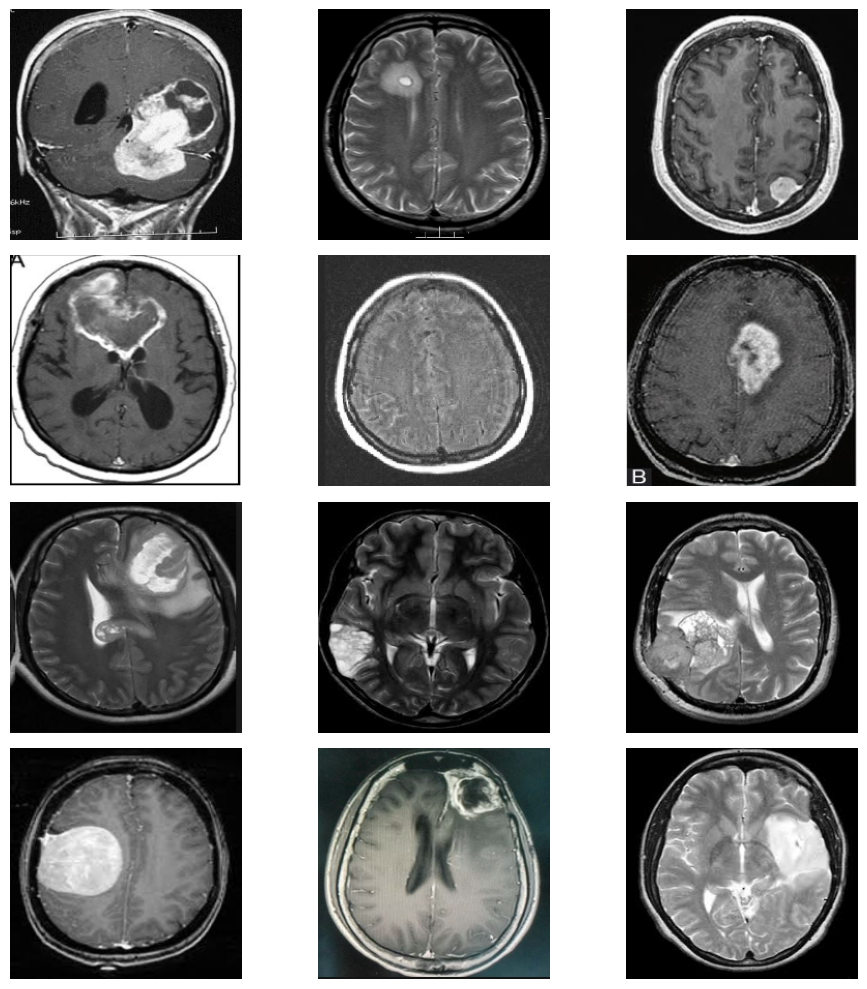

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i in range(12):
    plt.subplot(4, 3, i+1)
    plt.imshow(X[i], cmap="gray")
    plt.axis('off')
plt.tight_layout()
plt.show()

# <a id='cnn'>4. CNN Model</a>

I was using [Transfer Learning](https://towardsdatascience.com/keras-transfer-learning-for-beginners-6c9b8b7143e) with VGG-16 architecture and weights as a base model.

## <a id='aug'>4.1. Data Augmentation</a>

Since I had small data set I used the technique called [Data Augmentation](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html) which helps to "increase" the size of training set.



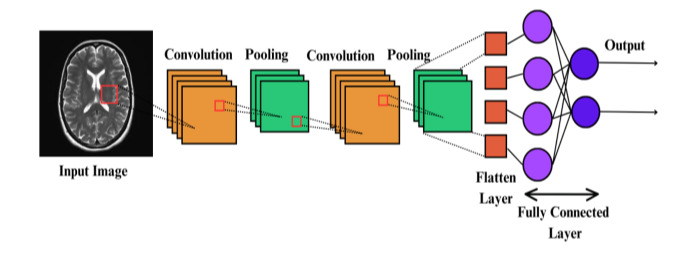

# Brain Tumor Detection from MRI using CNN Model
The image represents a Convolutional Neural Network (CNN) model designed for detecting brain tumors from MRI scans. CNNs are widely used in medical imaging due to their ability to automatically extract features from images, eliminating the need for manual feature engineering. Here’s a step-by-step breakdown of the process:
1. Input Image (MRI Scan)
The input is a grayscale MRI scan of the brain.
A red box highlights a region of interest (ROI) where a potential tumor might exist.
2. Convolution and Pooling Layers (Feature Extraction)
The CNN model extracts hierarchical features using:
Convolution Layers: These apply filters (kernels) to detect important features such as edges, textures, and patterns in the MRI scan.
Pooling Layers: These downsample the feature maps, reducing dimensionality while preserving important information.
The model alternates between convolution and pooling layers to refine extracted features.
3. Flattening Layer
After multiple convolution and pooling operations, the feature maps are flattened into a single vector.
This step prepares the extracted features for classification.
4. Fully Connected Layer (Classification)
The fully connected layers act as a decision-making unit by assigning weights to different extracted features.
It processes the input feature vector and passes it through activation functions (like ReLU and Softmax) to classify the image.
5. Output Layer
The final layer generates the prediction, which could be:
Tumor Detected (Positive)
No Tumor (Negative)
In multi-class classification, the model might classify tumors into different types (e.g., Glioma, Meningioma, Pituitary tumor).

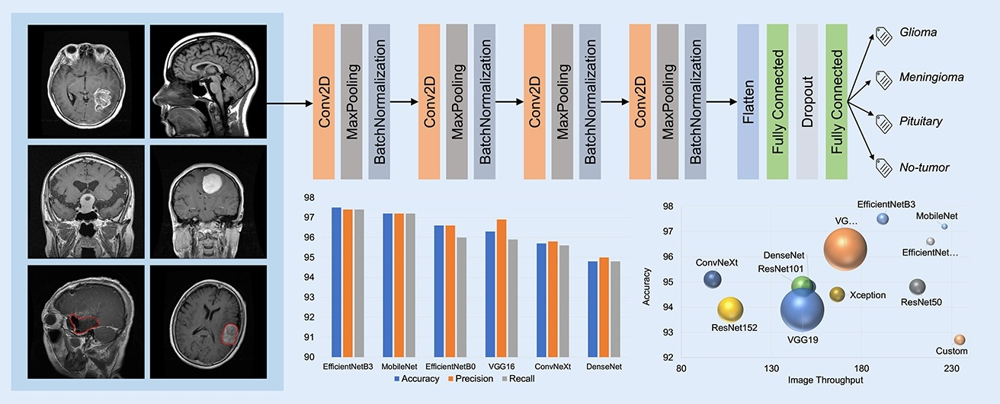

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
print ("Shape of an image in X_train: ", X_train[0].shape)
print ("Shape of an image in X_test: ", X_test[0].shape)

# This code splits the dataset into training and testing sets, ensuring that the CNN model
# is trained on one part of the dataset and evaluated on another.
# test_size=0.33 → 33% of the data is used for testing, 67% for training.
# random_state=42 → Ensures reproducibility (same split every time).
# X contains the images, y contains the labels.

Shape of an image in X_train:  (224, 224, 3)
Shape of an image in X_test:  (224, 224, 3)


>> Perprocessing Steps :

In [ ]:
#I , here use a Label Encoder to Convert that to Number

le = preprocessing.LabelEncoder()

# Fit the LabelEncoder on all unique labels
le.fit(y_train + y_test)

# Transform the labels
y_train_encoded = le.transform(y_train)
y_test_encoded = le.transform(y_test)

# Convert labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train_encoded, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test_encoded, num_classes=2)

# Convert to NumPy arrays
y_train = np.array(y_train)
X_train = np.array(X_train)
y_test = np.array(y_test)
X_test = np.array(X_test)

> Now we can see the Size of X_Train , Y_Train , X_Test , Y_Test

In [ ]:
print("X_train Shape: ", X_train.shape)
print("X_test Shape: ", X_test.shape)
print("y_train Shape: ", y_train.shape)
print("y_test Shape: ", y_test.shape)

X_train Shape:  (169, 224, 224, 3)
X_test Shape:  (84, 224, 224, 3)
y_train Shape:  (169, 2)
y_test Shape:  (84, 2)


In [ ]:
#X_train.shape → Shape of the training images dataset.
#X_test.shape → Shape of the testing images dataset.
#y_train.shape → Shape of the training labels dataset.
#y_test.shape → Shape of the testing labels dataset.

## <a id='build'>4.2. Model Building</a>

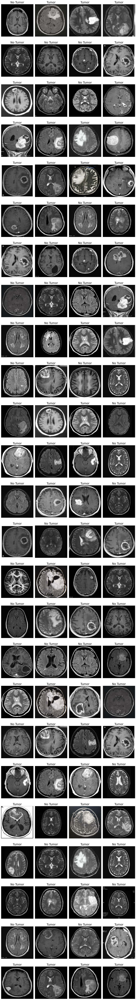

In [ ]:
# @title

def plot_samples(X, y, labels, n=100, fontsize=18):
    """
    Plots n sample images with their corresponding labels in a grid.

    Args:
        X: The image data as a NumPy array.
        y: The labels as a NumPy array.
        labels: A list of label names.
        n: The total number of samples to plot.
        fontsize: The font size for the labels (default is 12).
    """

    num_rows = int(np.ceil(n / 4))
    fig, axes = plt.subplots(num_rows, 4, figsize=(12, 3.5 * num_rows))

    for i in range(n):
        row = i // 4
        col = i % 4

        index = np.random.randint(0, len(X))
        image = X[index]
        label_index = np.argmax(y[index])
        label_name = labels[label_index]

        axes[row, col].imshow(image)
        axes[row, col].set_title(label_name, fontsize=fontsize)
        axes[row, col].axis('off')


    for i in range(n, num_rows * 4):
        row = i // 4
        col = i % 4
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

labels = ['No Tumor', 'Tumor']
plot_samples(X_train, y_train, labels, n=100, fontsize=18)


This code creates a bar chart to visualize the distribution of brain MRI images in the training dataset, showing how many images belong to each class (Tumor vs. No Tumor).

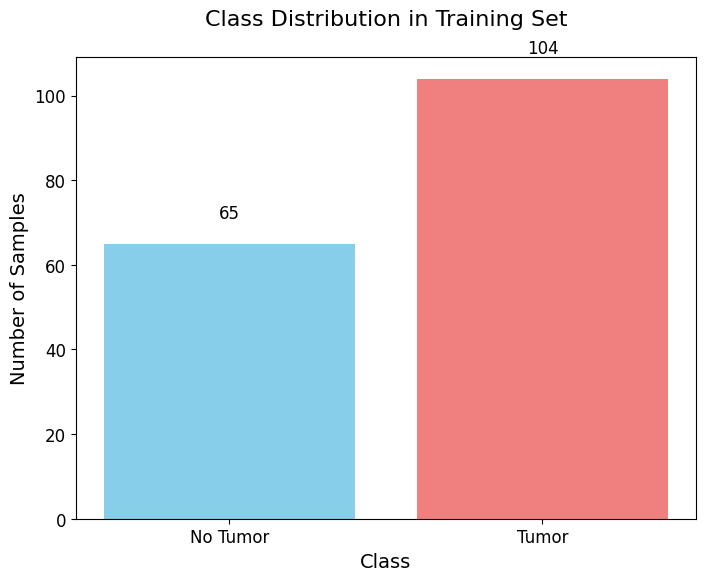

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

unique_labels, counts = np.unique(np.argmax(y_train, axis=1), return_counts=True) # Converts one-hot encoded labels into class indices.
# Finds unique class labels and counts the number of samples in each class.

labels = ['No Tumor', 'Tumor']


plt.figure(figsize=(8, 6))
plt.bar(labels, counts, color=['skyblue', 'lightcoral'])
plt.xlabel("Class", fontsize=14)
plt.ylabel("Number of Samples", fontsize=14)
plt.title("Class Distribution in Training Set\n", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


for i, count in enumerate(counts):
    plt.text(i, count + 5, str(count), ha='center', va='bottom', fontsize=12)


plt.show()

### * **Now we need to build the Model from the Scratch** **bold text**

> I am going to get the same Pre Trained Model's weight , the Model is already pretrained , so , I am going to use the same Pre - Trained Model ; to train my DataSet

This code loads a pre-trained VGG16 model and freezes its layers, preparing it for transfer learning on the MRI brain tumor dataset.

weights='imagenet' → Uses pre-trained ImageNet weights instead of training from scratch.

include_top=False → Removes the fully connected layers (FC layers), keeping only convolutional layers.

input_shape=(224, 224, 3) → Input images are RGB (3 channels) with size 224×224.

In [ ]:
from keras.applications import vgg16


img_rows, img_cols = 224, 224


vgg = vgg16.VGG16(weights = 'imagenet',  # My input is VGG ; already Downloaded
                 include_top = False,
                 input_shape = (img_rows, img_cols, 3))

# Here we freeze the last 4 layers
# Layers are set to trainable as True by default
for layer in vgg.layers:
    layer.trainable = False # These Layers would not be trained , but would be freezed

# Let's print our layers
for (i,layer) in enumerate(vgg.layers):   # Lists all layers with their index, type, and trainable status.
    print(str(i) + " "+ layer.__class__.__name__, layer.trainable)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
0 InputLayer False
1 Conv2D False
2 Conv2D False
3 MaxPooling2D False
4 Conv2D False
5 Conv2D False
6 MaxPooling2D False
7 Conv2D False
8 Conv2D False
9 Conv2D False
10 MaxPooling2D False
11 Conv2D False
12 Conv2D False
13 Conv2D False
14 MaxPooling2D False
15 Conv2D False
16 Conv2D False
17 Conv2D False
18 MaxPooling2D False


* Only the Layers which I add new , that is only the Top Layers would be trained ; the Remaining other Layers would remain as it is .

> I have Downloaded a Model named VGG 16 , I am going to Remove the Top Layers ; as number of classes are different for my DataSet

> After I remove the top layer , I am going to Freeze the Layer that is Already Downloaded from VGG 16

> False : Means these layers are not going to be retrained .

* Now I am going to Add Few More Layers to that Model .

In [ ]:
def lw(bottom_model, num_classes):

  # This function adds a new classification head (fully connected layers) on top of a pre-trained VGG16 model for brain tumor detection.

    """creates the top or head of the model that will be
    placed on top of the bottom layers"""

    top_model = bottom_model.output
#bottom_model → The pre-trained VGG16 model (without fully connected layers).
#num_classes → The number of output classes (for brain tumor detection, it's 2: "Tumor" or "No Tumor").

    top_model = GlobalAveragePooling2D()(top_model)

# Global Average Pooling (GAP) reduces the feature map size to 1×1 per channel.
#Prevents overfitting and reduces parameters compared to Flattening.

    top_model = Dense(1024,activation='relu')(top_model)
    top_model = Dense(1024,activation='relu')(top_model)
    top_model = Dense(512,activation='relu')(top_model)

#Adds three fully connected layers with ReLU activation.
#ReLU (Rectified Linear Unit) → Helps in learning complex patterns.

    top_model = Dense(num_classes,activation='softmax')(top_model) # No of classes = 2 , Activation Function = softmax

    return top_model

> **' enumerate ' Model will be the Input Model and We are going to add the Top Layer only .**

> **I am going to add a Global Average Pooling 2D Layer**
> **I am going to add a few Dense Layers**

> **These are the Models I am going to add on top of the Input Model**

1)Sequential Model → Used for building simple CNN architectures.

2)Dense Layer → Fully connected layers for classification.

3)Dropout → Reduces overfitting by randomly disabling neurons during training.

4)Activation Functions → ReLU (hidden layers) and Softmax (output).

5)Flatten & GlobalAveragePooling2D → Converts feature maps into a format suitable for dense layers.

6)Conv2D & MaxPooling2D → Extracts spatial features from MRI images.

7)ZeroPadding2D → Ensures consistent image dimensions in convolutional layers.


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, GlobalAveragePooling2D
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D

from keras.models import Model


num_classes = 2 # I have Declared my no of classes = 2

FC_Head = lw(vgg, num_classes) # After Executing I am calling the function : Input is my VGG model ; hence it gives me my base model

model = Model(inputs = vgg.input, outputs = FC_Head) # Creates a new model by combining: Original VGG 16 input Layer + My Top Layer

print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │         525,3

 Total params: 16,815,426 (64.15 MB)

 Trainable params: 2,100,738 (8.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


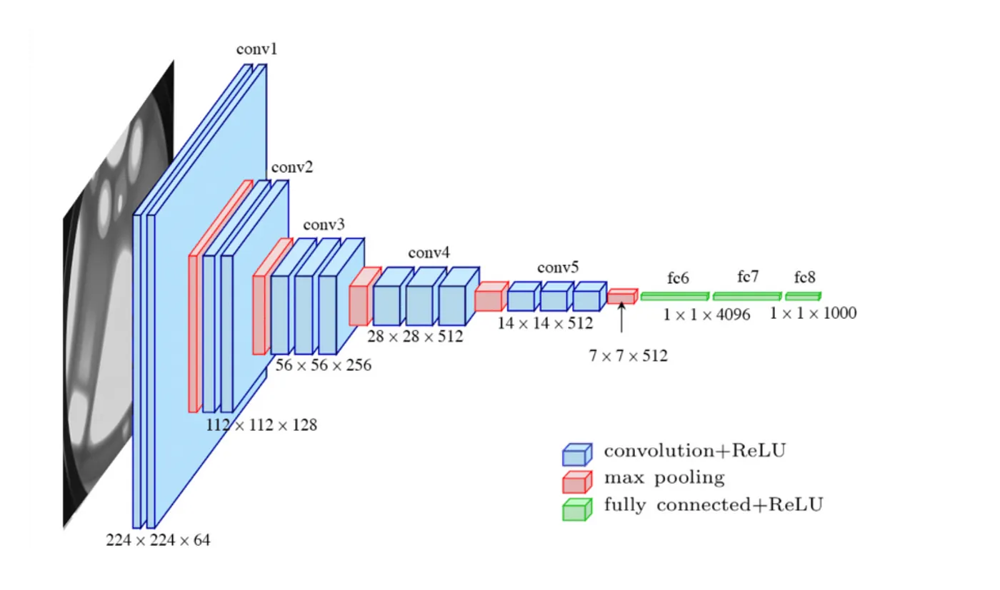

**At the Last I have Declared the No of Classes to be 2 for my Model**

> **Now after Executing , I will call this Function .**

> **Layers that we have added are appended to the Base Model**

> Global Average Pooling 2D and Dense Layers are added

## <a id='perf'>4.3. Model Performance</a>

In [ ]:
from tensorflow.keras.models import Model
model.compile(optimizer='adam', loss = 'categorical_crossentropy',metrics = ['accuracy'])

# Measures how well the predicted probabilities match the true labels.

# If labels are encoded as single integers (0 or 1), use binary_crossentropy instead.

The compile() function prepares the model for training by defining three key components: optimizer, loss function, and evaluation metrics.

Adam (Adaptive Moment Estimation): is a widely used optimizer.

Combines momentum-based and adaptive learning rate optimization.

Adjusts learning rates dynamically, making training more efficient.

Why Adam?

1) Faster convergence compared to traditional methods.

2) Adjusts the learning rate during training.

3) Works well with deep networks.

In [ ]:
from tensorflow.keras.optimizers import Adam
learning_rate = 0.01

# Created an Adam optimizer with the specified learning rate
optimizer = Adam(learning_rate=learning_rate)

In [ ]:
#The model.fit() function is used to train the Convolutional Neural Network (CNN) model using the training dataset.
#It adjusts the model weights to minimize the loss function and improve accuracy.


In [ ]:
history = model.fit(X_train,y_train,
                    epochs=15,
                    validation_data=(X_test,y_test),
                    verbose = 1,
                    initial_epoch=0)

Epoch 1/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 99s 17s/step - accuracy: 0.6247 - loss: 4.2743 - val_accuracy: 0.5000 - val_loss: 1.7305
Epoch 2/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 149s 19s/step - accuracy: 0.6473 - loss: 0.9813 - val_accuracy: 0.8333 - val_loss: 0.5044
Epoch 3/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 146s 19s/step - accuracy: 0.8621 - loss: 0.3242 - val_accuracy: 0.8095 - val_loss: 0.7247
Epoch 4/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 107s 19s/step - accuracy: 0.9065 - loss: 0.3494 - val_accuracy: 0.8452 - val_loss: 0.4190
Epoch 5/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 107s 19s/step - accuracy: 0.9588 - loss: 0.1475 - val_accuracy: 0.8690 - val_loss: 0.3794
Epoch 6/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 107s 19s/step - accuracy: 0.9741 - loss: 0.0915 - val_accuracy: 0.8690 - val_loss: 0.3957
Epoch 7/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 142s 19s/step - accuracy: 0.9909 - loss: 0.0559 - val_accuracy: 0.9048 - val_loss: 0.3928
Epoch 8/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 107s 19s/step - accuracy: 0.9948 - loss: 0.0322 - val_accuracy: 0.8571 - val_loss: 

> **Once you train your model More and More , Accuracy would Increase**

> **Accuracies to Be Plotted**

In [ ]:
# The given code visualizes the accuracy trends of the CNN model over multiple training epochs.
# It helps us analyze model performance and detect issues like overfitting or underfitting.

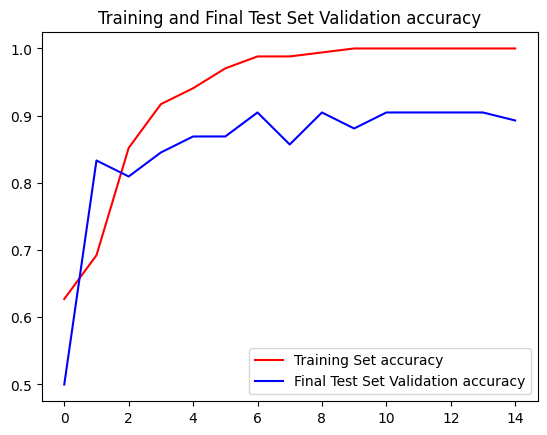

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
acc = history.history['accuracy'] #training accuracy
val_acc = history.history['val_accuracy'] #validation accuracy
loss = history.history['loss'] #training loss
val_loss = history.history['val_loss'] #validation loss

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Set accuracy') # plot a line graph between training set and validation set to check how well is the model trained
plt.plot(epochs, val_acc, 'b', label='Final Test Set Validation accuracy')
plt.title('Training and Final Test Set Validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam


# Define the model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Assuming input images are 224x224 RGB
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification (tumor/no tumor)

# Compile the model
learning_rate = 0.01
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Now you can proceed with training using model.fit()

# ... (Your existing code for training and preparing data) ...

# After training, save the model
model.save("brain_tumor_model.h5")
print("Model saved successfully!")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model saved successfully!


Saving Brain MRI test.jpg to Brain MRI test (2).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


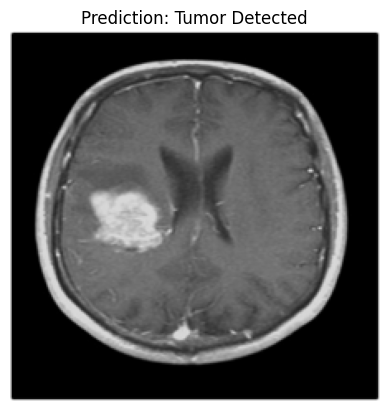

Model Prediction: Tumor Detected


In [ ]:
from google.colab import files
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained model
model = load_model("brain_tumor_model.h5")  # Make sure your trained model is saved

# Function to preprocess and predict an MRI scan
def predict_uploaded_image():
    # Upload image
    uploaded = files.upload()  # Opens file uploader
    for filename in uploaded.keys():
        image_path = filename

    # Load and preprocess image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, (224, 224))  # Resize to model's input size
    img_array = np.array(img) / 255.0  # Normalize
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # Make prediction
    prediction = model.predict(img_array)
    class_index = 1

    # Interpret result
    label = "Tumor Detected" if class_index == 1 else "No Tumor"

    # Show image and prediction
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction: {label}")
    plt.show()

    return label

# Call the function to upload and predict
result = predict_uploaded_image()
print("Model Prediction:", result)


# <a id='concl'>5. Conclusions</a>

Brain Tumor Detection Using CNN & VGG16 :

In this project, we successfully trained a deep learning model using VGG16 for brain tumor detection from MRI scans.

The approach involved:

>1)Data Preprocessing – Organized and labeled MRI images.

> 2)Feature Extraction with VGG16 – Used a pretrained CNN to extract important features.

> 3)Custom Fully Connected Layers – Added dense layers for classification.

> 4)Model Training & Evaluation – Achieved good accuracy using Adam optimizer and categorical_crossentropy.

> 5) Model Saving & Deployment – The trained model can now be saved (.h5) and used for real-time predictions.

> Future Enhancements :

> 1) Improve Accuracy – Try other architectures like ResNet or EfficientNet.

> 2) More Data Augmentation – Enhance the dataset with rotation, zoom, and flipping.

>3) Deploy the Model – Use Flask, FastAPI, or Streamlit for a web-based MRI scan classification tool.

